In [1]:
! pip install pytorch-lightning

In [2]:
import kagglehub
import os
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import random
import pandas as pd
import torch
import numpy as np
from torchvision.transforms import v2
from torch.utils.data import DataLoader,Dataset
from PIL import Image
import torchvision.models as models
import pytorch_lightning as pl
from torch import nn
import torch.nn.functional as F
import torchmetrics
from torchsummary import summary
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.callbacks import TQDMProgressBar

%matplotlib inline

In [3]:
# os.makedirs("/content/my_dataset",exist_ok=True)

In [4]:
# !kaggle datasets download -d puneet6060/intel-image-classification -p /content/my_dataset

In [5]:
# ! unzip /content/my_dataset/intel-image-classification.zip -d /content/my_dataset

# Load Train Image

In [6]:
train_image_path="/content/my_dataset/seg_train/seg_train/"

# Find Label Names

In [7]:
label_names=os.listdir(train_image_path)
print(f"Label Names :{label_names}")

Label Names :['sea', 'glacier', 'mountain', 'forest', 'buildings', 'street']


# Visualize some images from train data

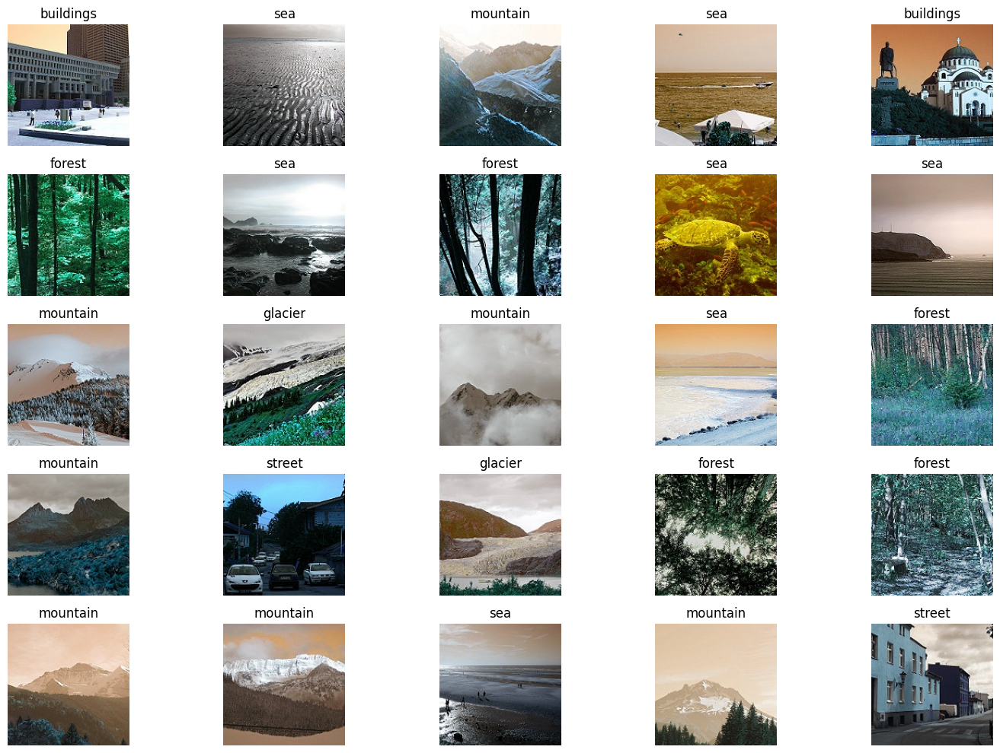

In [8]:
images=os.listdir(train_image_path)
fig,axes=plt.subplots(nrows=5,ncols=5,figsize=(15,10),sharey=True,sharex=True)
axes=axes.flatten()
for i in range(25):
  img=random.choice(images)
  intel_images=os.listdir(os.path.join(train_image_path,img))
  img_file=random.choice(intel_images)
  img_path=os.path.join(train_image_path,img,img_file)
  img=cv2.imread(img_path)
  axes[i].imshow(img)
  axes[i].set_title(img_path.split("/")[-2])
  axes[i].axis("off")

plt.tight_layout()
plt.show()

# Compare Each Class Length

<ipython-input-9-911cde5a1ea9>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Intel_Image",y="Image_Count",data=data,palette="gnuplot2")


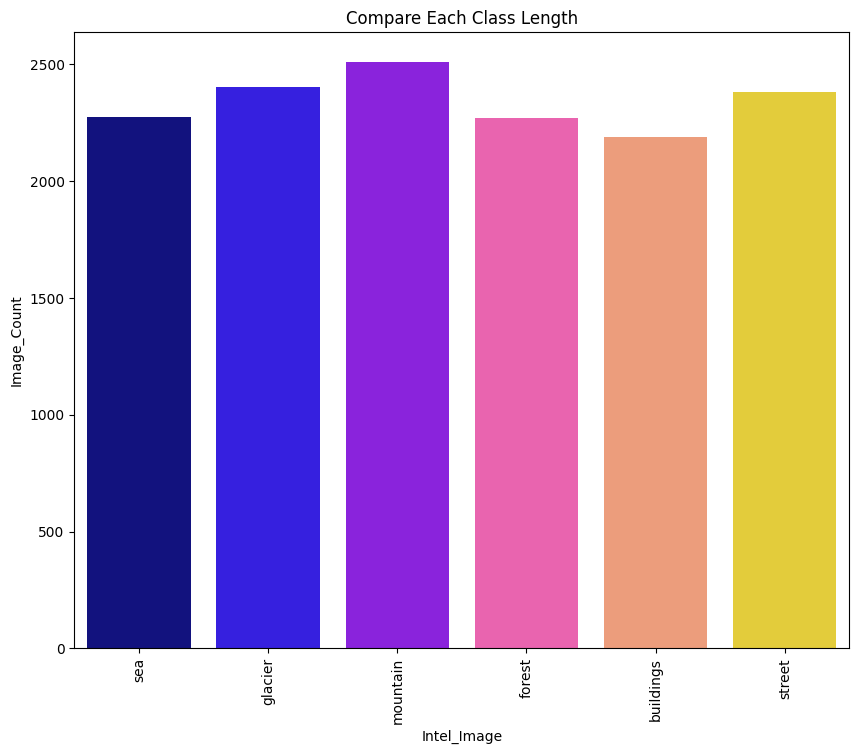

In [9]:
intel_image=os.listdir(train_image_path)

image_counts=[len(os.listdir(os.path.join(train_image_path,intel))) for intel in intel_image]

data=pd.DataFrame({"Intel_Image":intel_image,"Image_Count":image_counts})

plt.figure(figsize=(10,8))
sns.barplot(x="Intel_Image",y="Image_Count",data=data,palette="gnuplot2")
plt.xlabel("Intel_Image")
plt.ylabel("Image_Count")
plt.title("Compare Each Class Length")
plt.xticks(rotation=90)
plt.show()

# Load Valid Image

In [10]:
valid_image="/content/my_dataset/seg_test/seg_test/"

# Find Image Labels

In [11]:
val_label_names=os.listdir(train_image_path)
print(f"Label Names :{val_label_names}")

Label Names :['sea', 'glacier', 'mountain', 'forest', 'buildings', 'street']


# Visualize some Images From Validation dataset

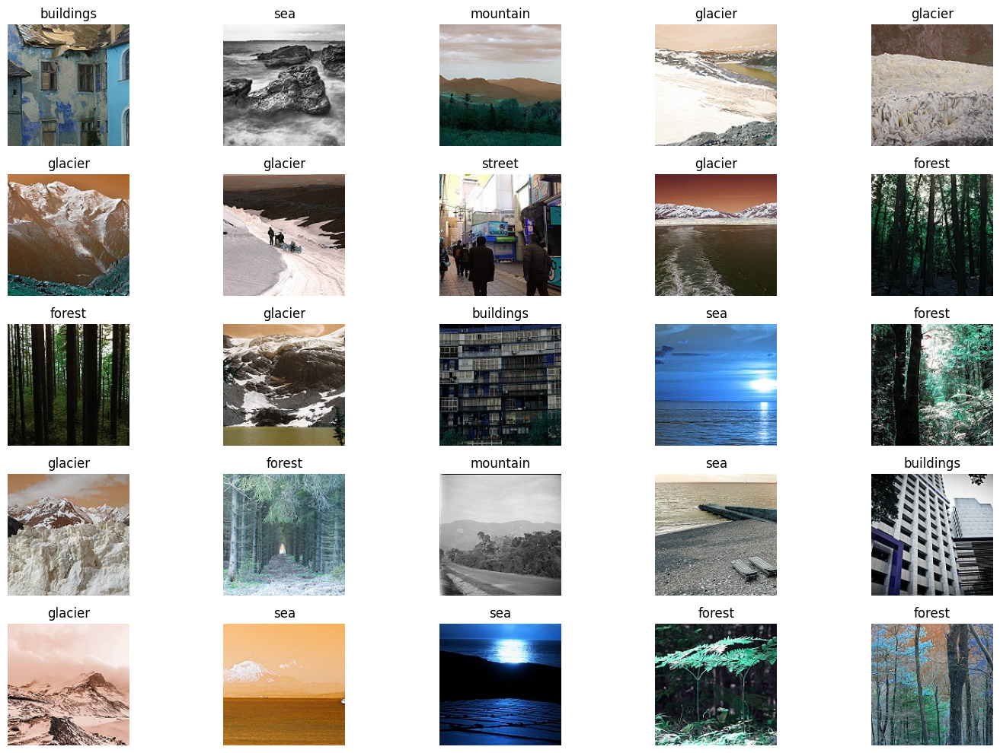

In [12]:
images=os.listdir(valid_image)
fig,axes=plt.subplots(nrows=5,ncols=5,figsize=(15,10),sharey=True,sharex=True)
axes=axes.flatten()
for i in range(25):
  img=random.choice(images)
  intel_images=os.listdir(os.path.join(valid_image,img))
  img_file=random.choice(intel_images)
  img_path=os.path.join(valid_image,img,img_file)
  img=cv2.imread(img_path)
  axes[i].imshow(img)
  axes[i].set_title(img_path.split("/")[-2])
  axes[i].axis("off")

plt.tight_layout()
plt.show()

# Compare Each Class

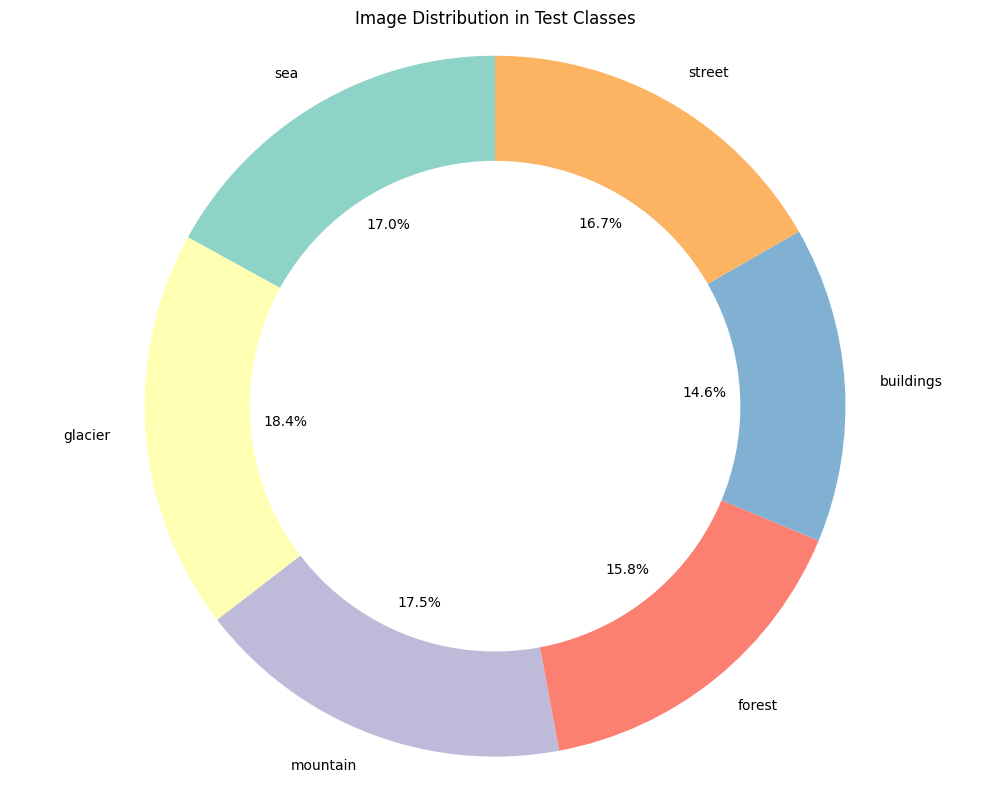

In [13]:
# List all subdirectories (representing each class)
valid_image_classes = os.listdir(valid_image)

# Count number of images in each class
image_counts_valid = [len(os.listdir(os.path.join(valid_image, class_name))) for class_name in valid_image_classes]

# Create DataFrame for visualization
data_valid = pd.DataFrame({"Class": valid_image_classes, "Image_Count": image_counts_valid})

# Donut chart visualization
fig, ax = plt.subplots(figsize=(10, 8))

# Plot a pie chart
wedges, texts, autotexts = ax.pie(data_valid['Image_Count'], labels=data_valid['Class'], autopct='%1.1f%%',
                                  startangle=90, colors=sns.color_palette("Set3", len(data_valid)))

# Create a hole in the middle to make it a donut chart
centre_circle = plt.Circle((0,0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)

# Equal aspect ratio ensures that pie is drawn as a circle
ax.axis('equal')

# Set chart title
plt.title("Image Distribution in Test Classes")
plt.tight_layout()

# Display the chart
plt.show()

# Transform Images

In [14]:
train_transforms = v2.Compose([
    v2.ToImage(),  # Convert PIL image to tensor image first
    v2.RandomResizedCrop(size=(150, 150), antialias=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),  # Convert to float and scale to [0, 1]
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

val_transforms = v2.Compose([
    v2.ToImage(),  # Convert PIL to tensor first
    v2.Resize(size=(150, 150), antialias=True),  # Center resize, not random
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Create dataset

In [15]:
class CustomImageDataset(Dataset):
    def __init__(self, root_dir="/content/my_dataset/seg_train/seg_train/", transform=None):
        """
        Custom dataset for image classification.

        Args:
            root_dir (str): Path to the dataset (e.g., /content/my_dataset/seg_train/seg_train/).
            transform (callable, optional): Transformations to apply to images.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.file_paths = []
        self.labels = []

        # Get class names (subfolders)
        self.classes = sorted([cls for cls in os.listdir(root_dir)
                             if os.path.isdir(os.path.join(root_dir, cls))])

        if not self.classes:
            raise ValueError(f"No class folders found in {root_dir}")

        # Map class names to indices
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}

        # Collect image paths and labels
        for label, class_name in enumerate(self.classes):
            class_folder = os.path.join(root_dir, class_name)

            for img_file in os.listdir(class_folder):
                img_path = os.path.join(class_folder, img_file)

                # Ensure it's a file, not a directory, and has a valid image extension
                if (os.path.isfile(img_path) and
                    img_file.lower().endswith(('.jpg', '.jpeg', '.png'))):
                    self.file_paths.append(img_path)
                    self.labels.append(label)
                else:
                    print(f"Skipping {img_path} - not a valid image file")

        if not self.file_paths:
            raise ValueError(f"No valid images found in {root_dir}")

    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        if idx >= len(self):
            raise IndexError(f"Index {idx} out of range for dataset of size {len(self)}")

        img_path = self.file_paths[idx]
        label = self.labels[idx]

        try:
            image = Image.open(img_path).convert("RGB")
        except (IOError, OSError) as e:
            print(f"Error loading image {img_path}: {e}")
            image = Image.new("RGB", (150, 150), color="gray")
            label = -1

        if self.transform:
            try:
                image = self.transform(image)
            except Exception as e:
                print(f"Error applying transform to {img_path}: {e}")
                image = v2.ToTensor()(image)

        return image, label


In [16]:

train_dataset=CustomImageDataset(train_image_path,transform=train_transforms)
valid_dataset=CustomImageDataset(valid_image,transform=val_transforms)

In [17]:
print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(valid_dataset)}")

Number of training samples: 14034
Number of validation samples: 3000


In [18]:


# Root directory of your dataset
train_image_path = "/content/my_dataset/seg_train/seg_train/"
valid_image_path = "/content/my_dataset/seg_test/seg_test/"

# Check how many images are in each folder for both train and valid directories
def count_images_in_folders(root_dir):
    class_names = os.listdir(root_dir)
    class_image_counts = {}

    for label_name in class_names:
        label_folder = os.path.join(root_dir, label_name)
        if os.path.isdir(label_folder):
            image_files = [f for f in os.listdir(label_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]
            class_image_counts[label_name] = len(image_files)

    return class_image_counts

# Print the number of images per class for training and validation data
print("Training dataset class image counts:", count_images_in_folders(train_image_path))
print("Validation dataset class image counts:", count_images_in_folders(valid_image_path))


Training dataset class image counts: {'sea': 2274, 'glacier': 2404, 'mountain': 2512, 'forest': 2271, 'buildings': 2191, 'street': 2382}
Validation dataset class image counts: {'sea': 510, 'glacier': 553, 'mountain': 525, 'forest': 474, 'buildings': 437, 'street': 501}


In [19]:
train_loader = torch.utils.data.DataLoader(dataset = train_dataset, batch_size = 32, shuffle=True)
val_loader = torch.utils.data.DataLoader(dataset = valid_dataset, batch_size = 32, shuffle=False)

In [20]:
image,label=next(iter(train_loader))
print(f"Image Shape: {image.shape}")
print(f"Label Shape: {label.shape}")

Image Shape: torch.Size([32, 3, 150, 150])
Label Shape: torch.Size([32])


# Creating our Lightning Module using a Pre-trained (ImageNet) Model

In [21]:
class ImagenetTransferLearning(pl.LightningModule):
    def __init__(self):
        super().__init__()
        # Accuracy for 6 classes
        self.accuracy = torchmetrics.Accuracy(task="multiclass", num_classes=6)

        # Init pretrained ResNet50
        backbone = models.resnet50(weights="IMAGENET1K_V1")
        num_filters = backbone.fc.in_features
        layers = list(backbone.children())[:-1]
        self.feature_extractor = nn.Sequential(*layers)

        # Classifier for 6 target classes
        num_target_classes = 6
        self.classifier = nn.Linear(num_filters, num_target_classes)

        # Example input for summary
        self.example_input_array = torch.zeros(1, 3, 150, 150)

    def forward(self, x):
        self.feature_extractor.eval()
        with torch.no_grad():
            representations = self.feature_extractor(x).flatten(1)
        x = self.classifier(representations)
        return x  # Return logits, not softmax

    def training_step(self, batch, batch_idx):
        data, label = batch
        logits = self.forward(data)
        loss = nn.CrossEntropyLoss()(logits, label)
        acc = self.accuracy(logits, label)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        self.log('train_acc', acc, on_step=True, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        val_data, val_label = batch
        logits = self.forward(val_data)
        val_loss = nn.CrossEntropyLoss()(logits, val_label)
        val_acc = self.accuracy(logits, val_label)
        self.log('val_loss', val_loss, on_step=True, on_epoch=True, prog_bar=True)
        self.log('val_acc', val_acc, on_step=True, on_epoch=True, prog_bar=True)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
        return optimizer

    def train_dataloader(self):
        return train_loader

    def val_dataloader(self):
        return val_loader

# Create the model
model = ImagenetTransferLearning()

# Print model summary
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
summary(model, input_size=(3, 150, 150))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 75, 75]           9,408
       BatchNorm2d-2           [-1, 64, 75, 75]             128
              ReLU-3           [-1, 64, 75, 75]               0
         MaxPool2d-4           [-1, 64, 38, 38]               0
            Conv2d-5           [-1, 64, 38, 38]           4,096
       BatchNorm2d-6           [-1, 64, 38, 38]             128
              ReLU-7           [-1, 64, 38, 38]               0
            Conv2d-8           [-1, 64, 38, 38]          36,864
       BatchNorm2d-9           [-1, 64, 38, 38]             128
             ReLU-10           [-1, 64, 38, 38]               0
           Conv2d-11          [-1, 256, 38, 38]          16,384
      BatchNorm2d-12          [-1, 256, 38, 38]             512
           Conv2d-13          [-1, 256, 38, 38]          16,384
      BatchNorm2d-14          [-1, 256,

In [22]:
logger = TensorBoardLogger("tb_logs", name="my_model")
trainer=pl.Trainer(accelerator="gpu",max_epochs=5,logger=logger,devices=1,enable_progress_bar=True,callbacks=[TQDMProgressBar()])

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [23]:

trainer.fit(model)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name              | Type               | Params | Mode  | In sizes         | Out sizes      
------------------------------------------------------------------------------------------------------
0 | accuracy          | MulticlassAccuracy | 0      | train | ?                | ?              
1 | feature_extractor | Sequential         | 23.5 M | eval  | [1, 3, 150, 150] | [1, 2048, 1, 1]
2 | classifier        | Linear             | 12.3 K | train | [1, 2048]        | [1, 6]         
------------------------------------------------------------------------------------------------------
23.5 M    Trainable params
0         Non-trainable params
23.5 M    Total params
94.081    Total estimated model params size (MB)
2         Modules in train mode
150       Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.


In [24]:
%load_ext tensorboard
%tensorboard --logdir /content/tb_logs

<IPython.core.display.Javascript object>

# Run inference on 32 images from our test data loder

In [25]:
class_names=train_loader.dataset.classes
class_names

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

Processing Batches:   1%|          | 1/94 [00:00<00:26,  3.56batch/s]


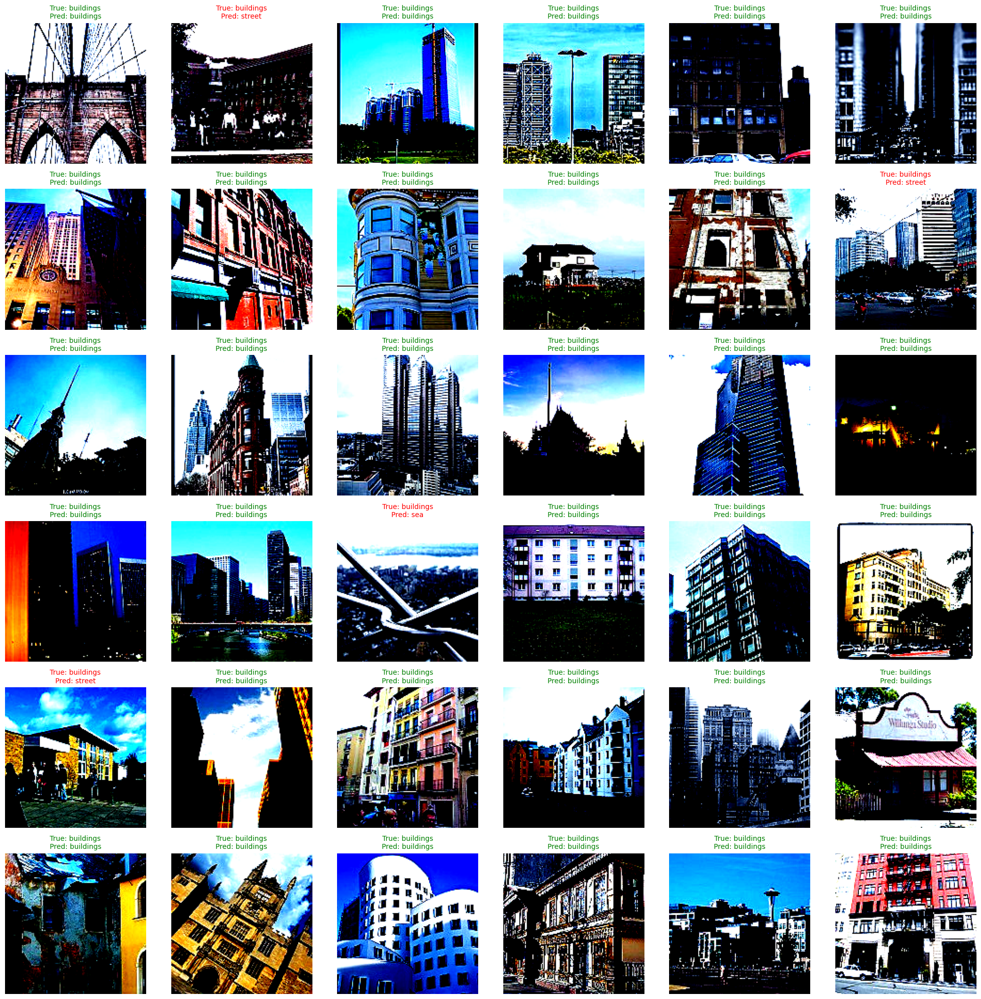

In [26]:
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

model.to(device)

model.eval()

# Define the number of images to plot
num_images = 36

# Create a figure for displaying images
fig, axes = plt.subplots(6, 6, figsize=(20, 20))

# No gradient calculations for efficiency
with torch.no_grad():
    images_plotted = 0  # Counter to track the number of images plotted

    # Use tqdm to show progress bar
    test_loader = tqdm(val_loader, desc="Processing Batches", unit="batch")

    for data in test_loader:
        images, labels = data

        # Move to GPU if available
        images, labels = images.to(device), labels.to(device)

        # Model predictions
        outputs = model(images)
        predictions = torch.argmax(outputs, dim=1)

        for i in range(images.shape[0]):
            pred = predictions[i].item()
            label = labels[i].item()

            # Select subplot
            ax = axes[images_plotted // 6, images_plotted % 6]

            # Convert tensor image to numpy and transpose (C, H, W) → (H, W, C)
            img = images[i].cpu().numpy().transpose(1, 2, 0)

            # Normalize or clip image to [0, 1] for display
            img = np.clip(img, 0, 1)

            # Display the image
            ax.imshow(img)  # Remove cmap='gray' since it's RGB
            ax.axis('off')

            # Map the numeric labels to class names
            label_name = class_names[label]
            pred_name = class_names[pred]

            # Title color based on correctness
            color = 'green' if pred == label else 'red'
            ax.set_title(f'True: {label_name}\nPred: {pred_name}', color=color, fontsize=10)

            images_plotted += 1

            # Stop once we plot 36 images
            if images_plotted >= num_images:
                break

        if images_plotted >= num_images:
            break

plt.tight_layout()
plt.show()


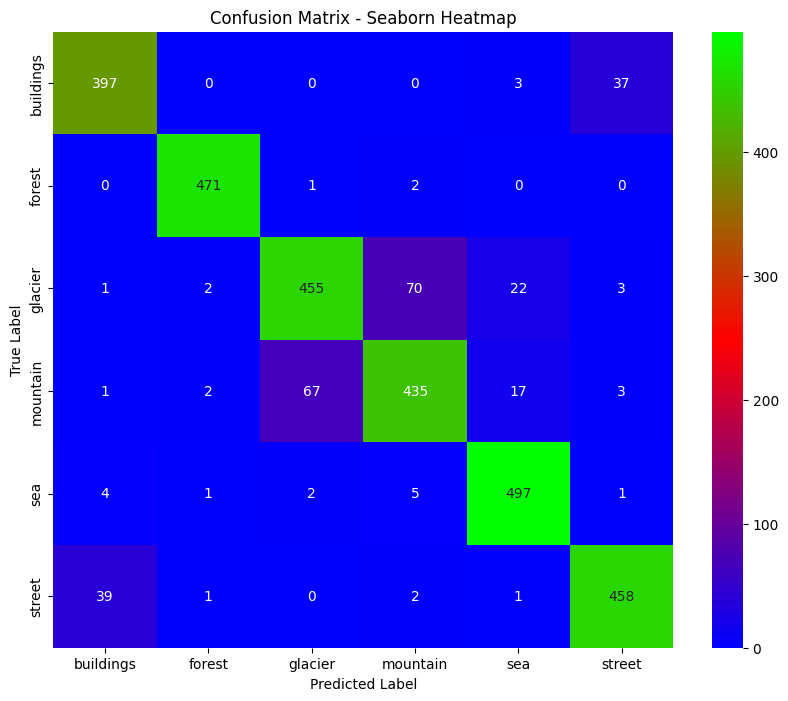

In [27]:
from sklearn.metrics import confusion_matrix,classification_report

model.eval()

preds=[]
trues=[]

with torch.no_grad():
  for sample,label in val_loader:
    sample=sample.to(device)
    label=label.to(device)
    output=model(sample)
    pred=torch.argmax(output,dim=1)
    preds.extend(pred.cpu().tolist())
    trues.extend(label.cpu().tolist())


# Compute confusion matrix
cm = confusion_matrix(trues, preds)

# Plot using Seaborn heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="brg", xticklabels=class_names, yticklabels=class_names)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Seaborn Heatmap")
plt.show()

In [28]:
print(classification_report(trues,preds,target_names=class_names))

              precision    recall  f1-score   support

   buildings       0.90      0.91      0.90       437
      forest       0.99      0.99      0.99       474
     glacier       0.87      0.82      0.84       553
    mountain       0.85      0.83      0.84       525
         sea       0.92      0.97      0.95       510
      street       0.91      0.91      0.91       501

    accuracy                           0.90      3000
   macro avg       0.91      0.91      0.91      3000
weighted avg       0.90      0.90      0.90      3000



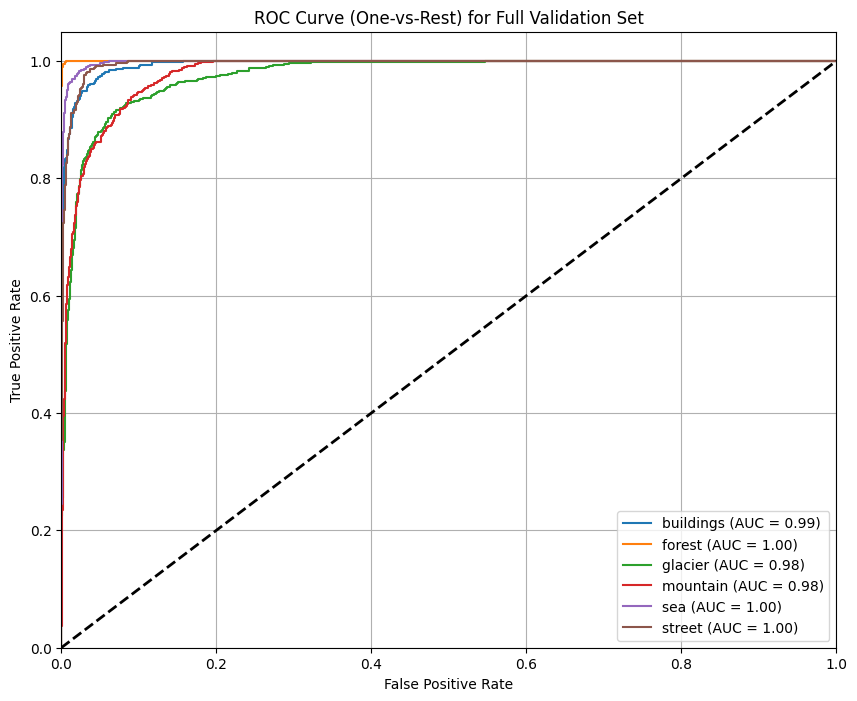

In [29]:

from sklearn.metrics import roc_curve, auc

# Assuming val_loader, model, and label_names are defined
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()

all_probs = []
trues = []

with torch.no_grad():
    for sample, label in val_loader:
        sample = sample.to(device)
        label = label.to(device)
        output = model(sample)
        probs = torch.softmax(output, dim=1)
        all_probs.extend(probs.cpu().numpy())
        trues.extend(label.cpu().tolist())

# Convert to numpy arrays
all_probs = np.array(all_probs)
trues = np.array(trues)

# Number of classes
num_classes = 6

# Binarize true labels for ROC
labels_bin = np.zeros((len(trues), num_classes))
for i in range(len(trues)):
    labels_bin[i, trues[i]] = 1

# Plot ROC curve
plt.figure(figsize=(10, 8))
for i in range(num_classes):
    if np.sum(labels_bin[:, i]) > 0:  # Only plot if class has positive samples
        fpr, tpr, _ = roc_curve(labels_bin[:, i], all_probs[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (One-vs-Rest) for Full Validation Set')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()